In [6]:
!pip install numpy scipy matplotlib imageio scikit-image


[notice] A new release of pip is available: 25.3 -> 26.1.2
[notice] To update, run: python.exe -m pip install --upgrade pip


In [1]:
import numpy as np
import imageio.v2 as imageio
import matplotlib.pyplot as plt
import warnings
import scipy
import skimage  #install scikit-image


warnings.filterwarnings("ignore")

In [6]:
photo_data = imageio.imread("data/sd-3layers.jpg")
print(type(photo_data))


<class 'numpy.ndarray'>


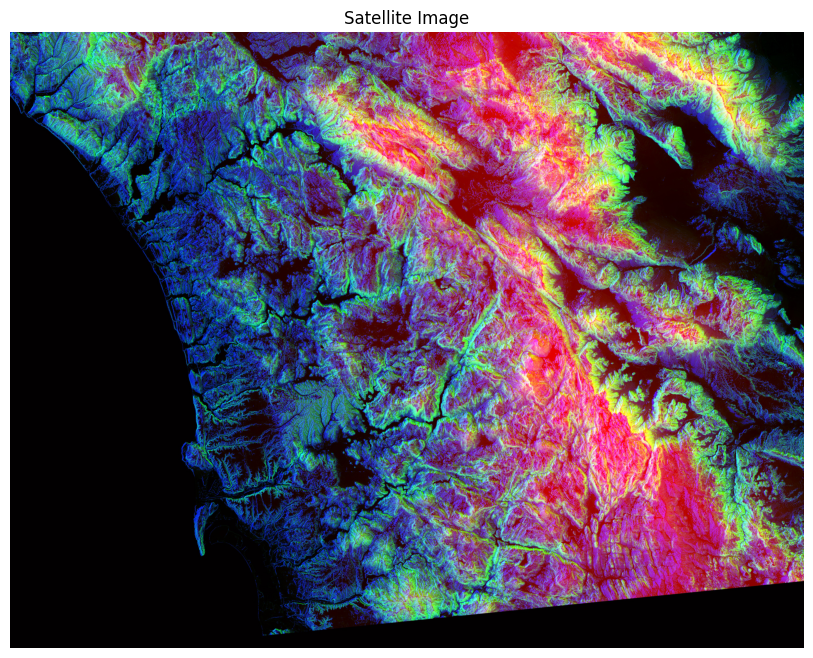

In [7]:
## Display the Original Image

plt.figure(figsize=(12, 8))
plt.imshow(photo_data)
plt.title("Satellite Image")
plt.axis("off")
plt.show()

In [8]:
##  Analyze Image Properties

print("Image Shape :", photo_data.shape)
print("Total Elements :", photo_data.size)
print("Minimum Pixel :", photo_data.min())
print("Maximum Pixel :", photo_data.max())
print("Average Pixel :", round(photo_data.mean(),2))

Image Shape : (3725, 4797, 3)
Total Elements : 53606475
Minimum Pixel : 0
Maximum Pixel : 255
Average Pixel : 75.78


In [14]:
## Examine Pixel Values

print("Pixel at (150,250):", photo_data[150,250])
print("Green Value :", photo_data[150,250,1])

print("Pixel at (1,1):", photo_data[1,1])

Pixel at (150,250): [ 15  42 233]
Green Value : 42
Pixel at (1,1): [ 25  47 130]


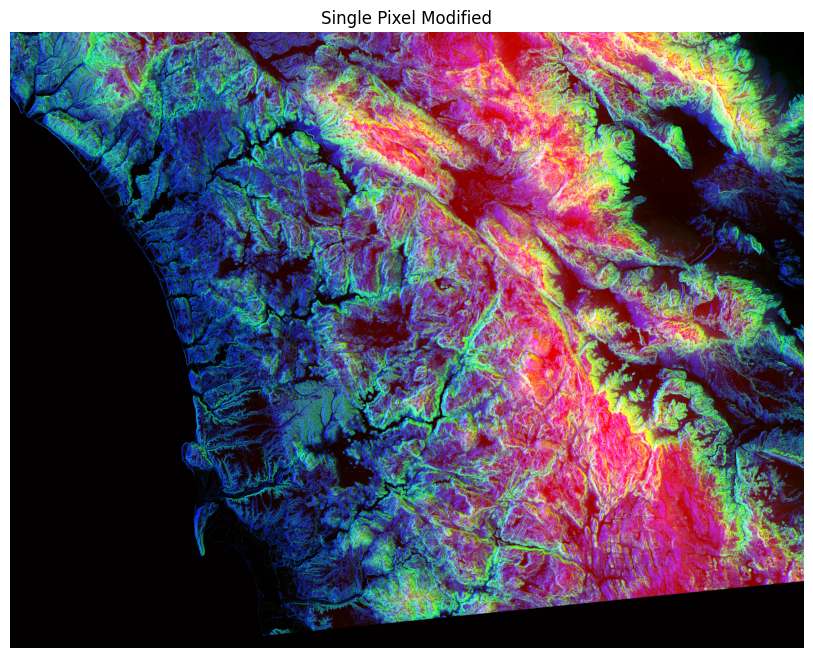

In [11]:
##  Modify a Single Pixel

modified_image = photo_data.copy()

modified_image[150,250] = [0,0,0]

plt.figure(figsize=(12,8))
plt.imshow(modified_image)
plt.title("Single Pixel Modified")
plt.axis("off")
plt.show()

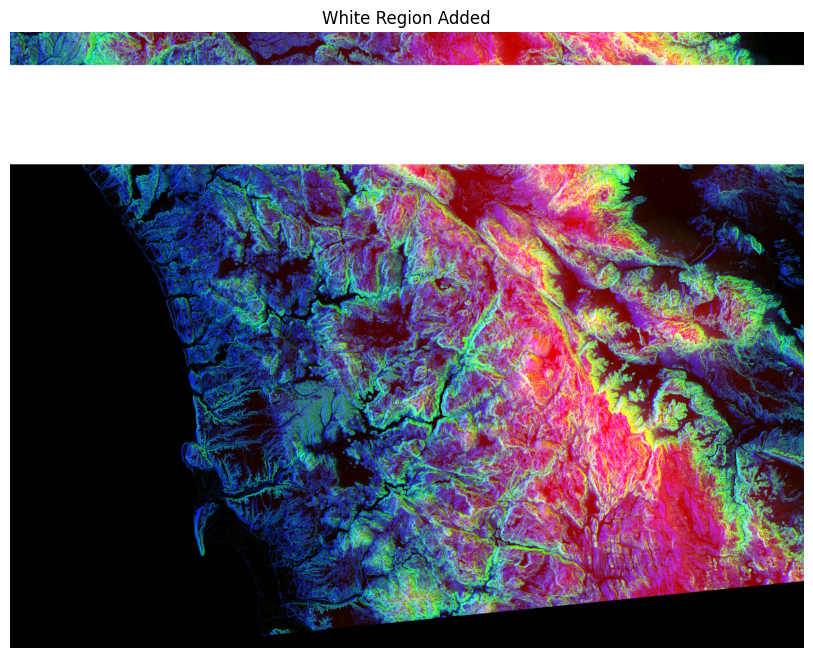

In [12]:
## Modify a white Region


region_image = photo_data.copy()

region_image[200:800,:,:] = 255

plt.figure(figsize=(12,8))
plt.imshow(region_image)
plt.title("White Region Added")
plt.axis("off")
plt.show()

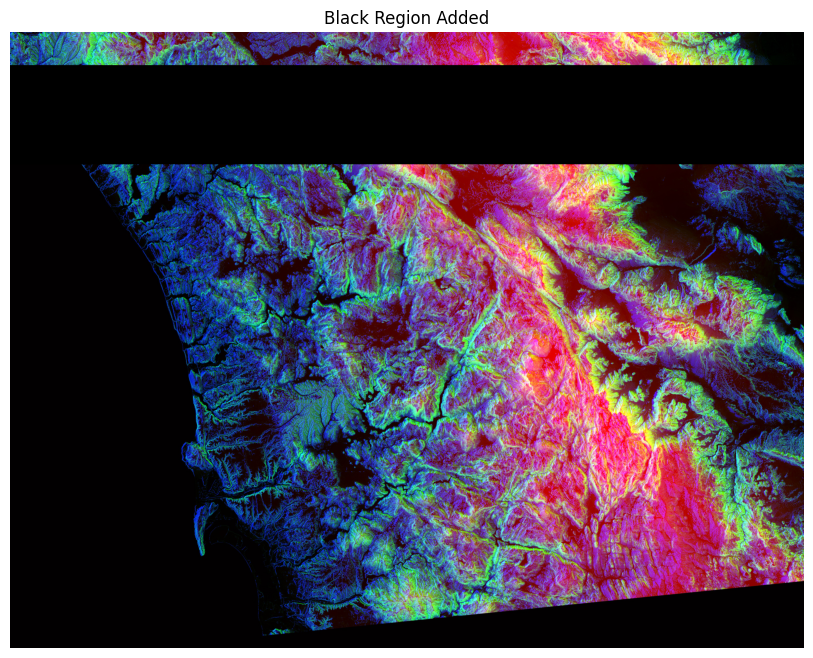

In [13]:
## Black region 
black_image = photo_data.copy()

black_image[200:800,:,:] = 0

plt.figure(figsize=(12,8))
plt.imshow(black_image)
plt.title("Black Region Added")
plt.axis("off")
plt.show()

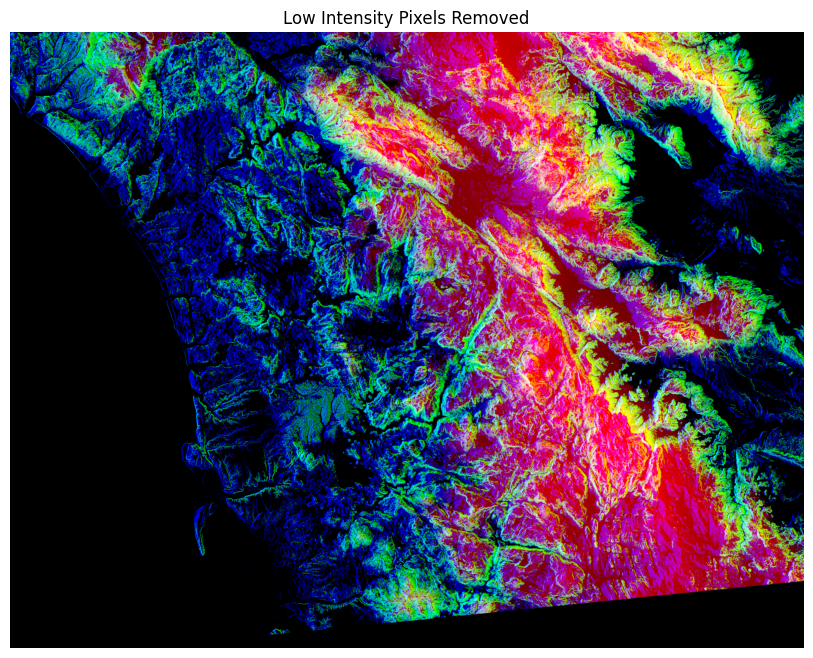

In [15]:
## Filter Low Intensity Pixels

filtered_image = photo_data.copy()

low_value_filter = filtered_image < 100

filtered_image[low_value_filter] = 0

plt.figure(figsize=(12,8))
plt.imshow(filtered_image)
plt.title("Low Intensity Pixels Removed")
plt.axis("off")
plt.show()

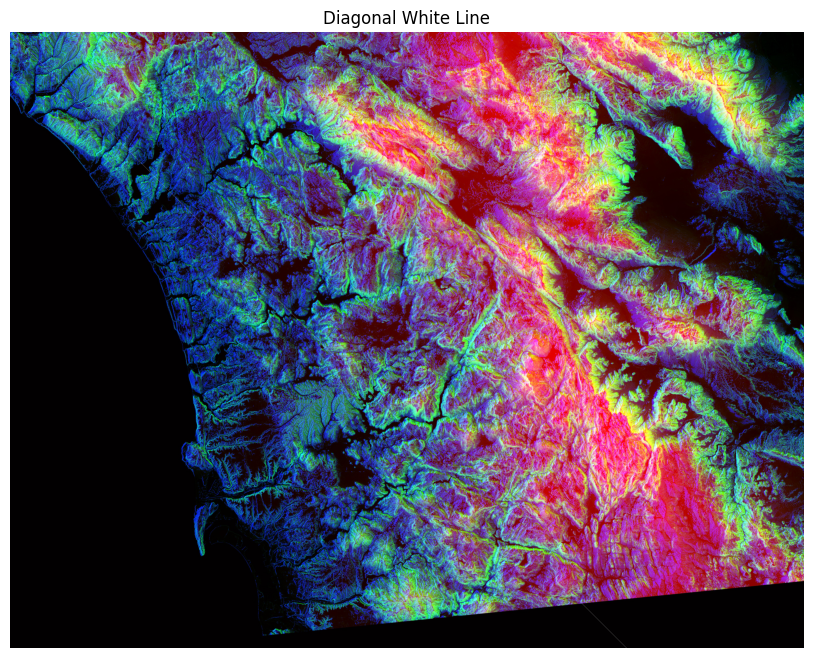

In [16]:
##Create a Diagonal Pattern
diagonal_image = photo_data.copy()

rows = np.arange(min(diagonal_image.shape[0], diagonal_image.shape[1]))

diagonal_image[rows, rows] = 255

plt.figure(figsize=(12,8))
plt.imshow(diagonal_image)
plt.title("Diagonal White Line")
plt.axis("off")
plt.show()

In [18]:
rows = np.arange(min(diagonal_image.shape[0], diagonal_image.shape[1]))

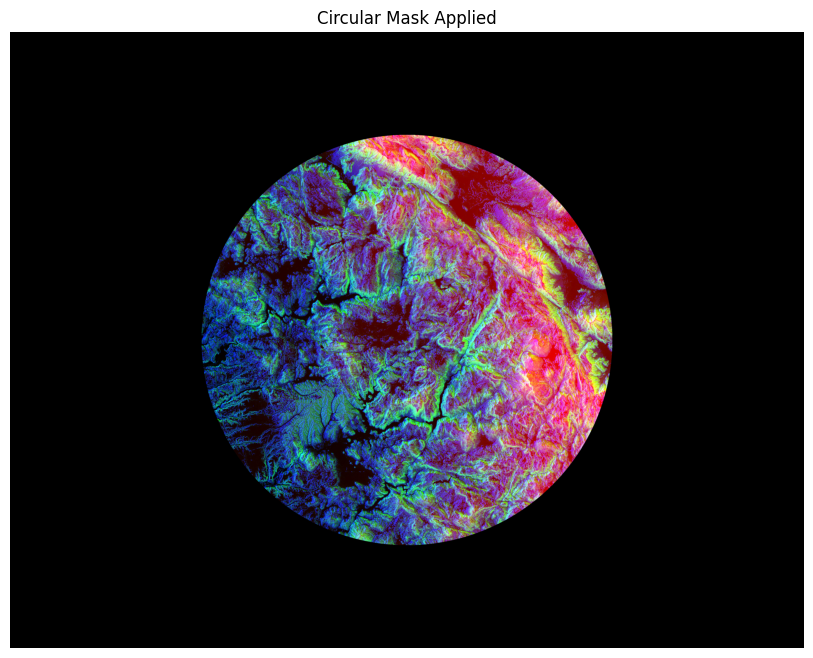

In [19]:
## Apply a Circular Mask
mask_image = photo_data.copy()

rows, cols, _ = mask_image.shape

X, Y = np.ogrid[:rows, :cols]

center_x = rows // 2
center_y = cols // 2

radius = min(rows, cols) // 3

distance = (X - center_x) ** 2 + (Y - center_y) ** 2

circular_mask = distance <= radius ** 2

mask_image[~circular_mask] = 0

plt.figure(figsize=(12,8))
plt.imshow(mask_image)
plt.title("Circular Mask Applied")
plt.axis("off")
plt.show()

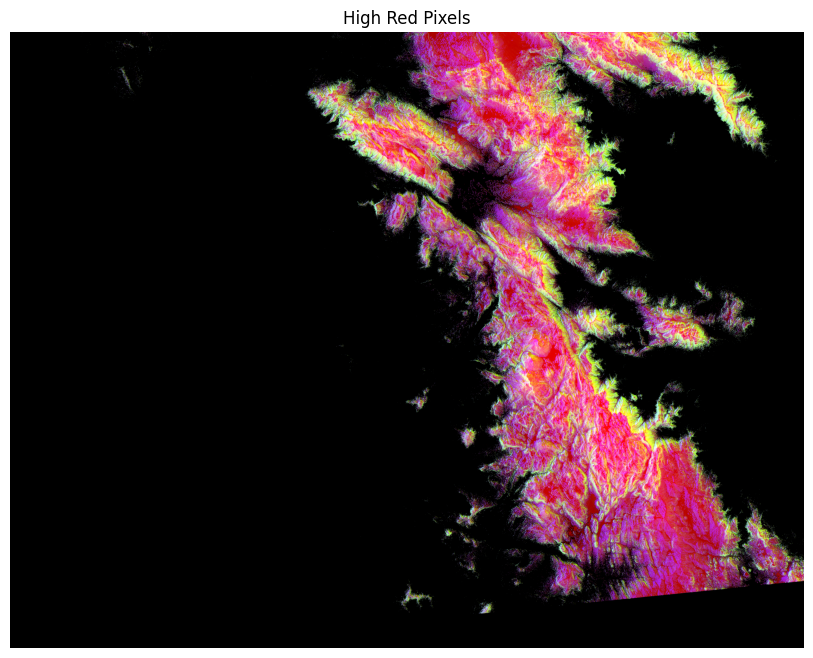

In [20]:
##  Detect High Red Pixels

red_image = photo_data.copy()

red_mask = red_image[:, :, 0] < 150

red_image[red_mask] = 0

plt.figure(figsize=(12,8))
plt.imshow(red_image)
plt.title("High Red Pixels")
plt.axis("off")
plt.show()

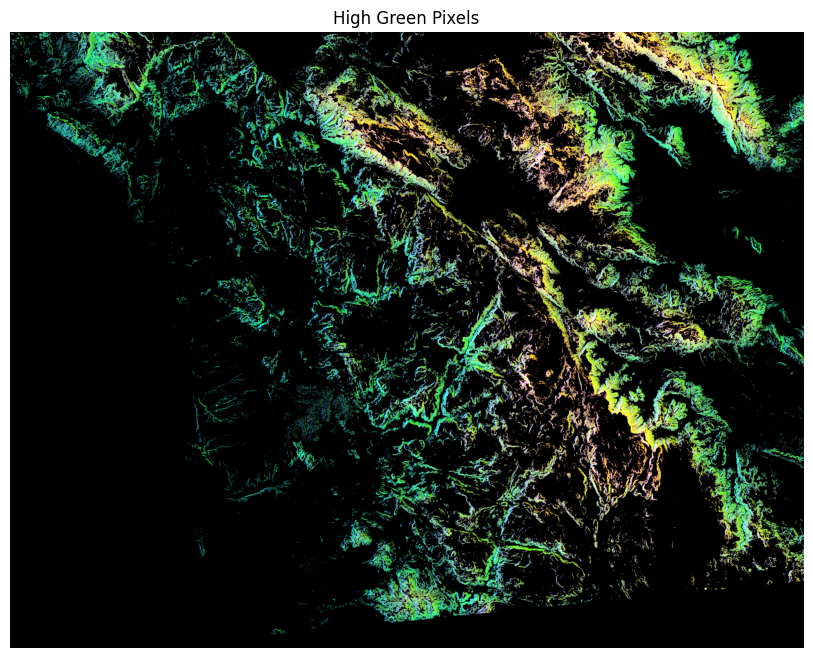

In [21]:
## Detect High Green Pixels

green_image = photo_data.copy()

green_mask = green_image[:, :, 1] < 150

green_image[green_mask] = 0

plt.figure(figsize=(12,8))
plt.imshow(green_image)
plt.title("High Green Pixels")
plt.axis("off")
plt.show()

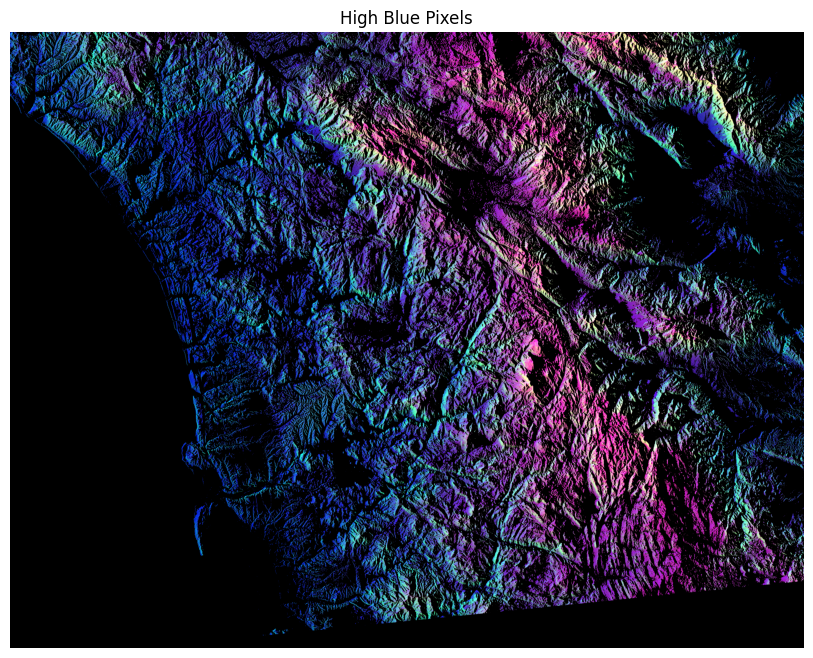

In [22]:
## Detect High Blue Pixels

blue_image = photo_data.copy()

blue_mask = blue_image[:, :, 2] < 150

blue_image[blue_mask] = 0

plt.figure(figsize=(12,8))
plt.imshow(blue_image)
plt.title("High Blue Pixels")
plt.axis("off")
plt.show()

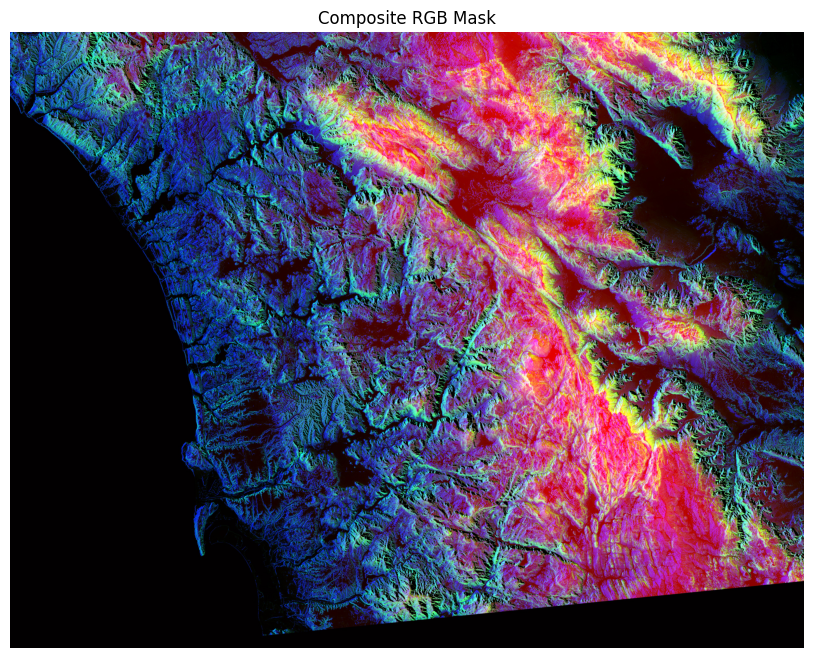

In [23]:
##  Apply a Composite RGB Mask

final_image = photo_data.copy()

red_mask = final_image[:, :, 0] < 150
green_mask = final_image[:, :, 1] > 100
blue_mask = final_image[:, :, 2] < 100

combined_mask = np.logical_and(red_mask, green_mask)
combined_mask = np.logical_and(combined_mask, blue_mask)

final_image[combined_mask] = 0

plt.figure(figsize=(12,8))
plt.imshow(final_image)
plt.title("Composite RGB Mask")
plt.axis("off")
plt.show()